In [28]:
# from google.colab import drive
# drive.mount('/content/drive')

In [29]:
import open_clip
print(open_clip.__version__)


3.2.0


In [30]:
! pip install open_clip_torch matplotlib

In [31]:
import open_clip
import torch
import torch.nn.functional as F
from PIL import Image
import json, os
from pathlib import Path
from tqdm import tqdm
import numpy as np

In [32]:
# --- Device / helpers ---
device = "cuda" if torch.cuda.is_available() else "cpu"
amp_enabled = (device == "cuda")

In [33]:
# --- Setup (paths) ---
ANN_PATH = "./data/nocap_val_4500_captions.json"
IMG_DIR = "./data/images"
CAPTION_JSON = "./data/caption.json"
CAPTION_CLIPSCORE_JSON = "./data/captions_with_clipscores.json"
CAPTION_HYBRID_JSON = "./data/captions_hybrid_scored.json"

In [34]:
with open(ANN_PATH, "r") as f:
    data = json.load(f)

print(json.dumps(data, indent=2, ensure_ascii=False))

{
  "licenses": [],
  "info": {
    "url": "",
    "date_created": "2018/11/06",
    "version": "0.1",
    "description": "nocap validation dataset",
    "contributor": "",
    "year": 2018
  },
  "images": [
    {
      "height": 1024,
      "file_name": "0013ea2087020901.jpg",
      "width": 732,
      "coco_url": "https://requestor-proxy.figure-eight.com/figure_eight_datasets/open-images/validation/0013ea2087020901.jpg",
      "open_images_id": "0013ea2087020901",
      "id": 0,
      "license": 0,
      "domain": "in-domain",
      "date_captured": "2018-11-06 11:04:33"
    },
    {
      "height": 768,
      "file_name": "0032257bf3cd56d0.jpg",
      "width": 1024,
      "coco_url": "https://requestor-proxy.figure-eight.com/figure_eight_datasets/open-images/validation/0032257bf3cd56d0.jpg",
      "open_images_id": "0032257bf3cd56d0",
      "id": 1,
      "license": 0,
      "domain": "near-domain",
      "date_captured": "2018-11-06 11:04:33"
    },
    {
      "height": 768,
    

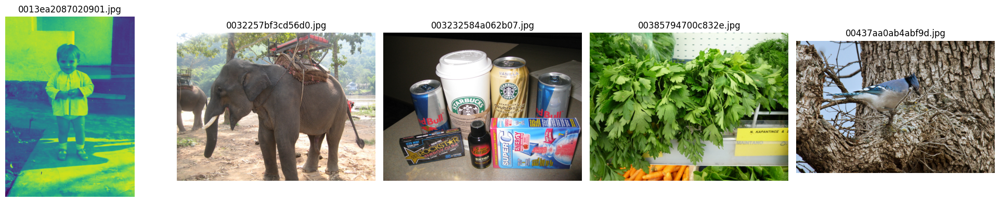

In [35]:
from PIL import Image

import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 5, figsize=(20, 4))
for i, img_info in enumerate(images[:5]):
    img_path = os.path.join(IMG_DIR, img_info["file_name"])
    img = Image.open(img_path)
    axs[i].imshow(img)
    axs[i].set_title(img_info["file_name"])
    axs[i].axis('off')
plt.tight_layout()
plt.show()

In [36]:
def clean_caption(tokens):
    # open_clip.decode -> string with special tokens; strip them
    s = open_clip.decode(tokens).split("<end_of_text>")[0]
    s = s.replace("<start_of_text>", "").strip()
    # normalize whitespace
    return " ".join(s.split())

# --- Model variants you requested ---
VARIANTS = [
    ("coca_ViT-B-32", "laion2b_s13b_b90k"),
    ("coca_ViT-B-32", "mscoco_finetuned_laion2b_s13b_b90k"),
    ("coca_ViT-L-14", "laion2b_s13b_b90k"),
    ("coca_ViT-L-14", "mscoco_finetuned_laion2b_s13b_b90k"),
]

# --- Load all models & transforms once (to avoid reloading per image) ---
models = []
for model_name, ckpt in VARIANTS:
    model, _, transform = open_clip.create_model_and_transforms(
        model_name=model_name,
        pretrained=ckpt
    )
    model = model.to(device)
    model.eval()
    models.append((model_name, ckpt, model, transform))

print(f"Loaded {len(models)} CoCa variants on {device}.")

Loaded 4 CoCa variants on cuda.


In [37]:
# --- Read nocaps json ---
LIMIT = 10

with open(ANN_PATH, "r") as f:
    nocaps = json.load(f)

images = nocaps.get("images", [])
if LIMIT is not None:
    images = images[:LIMIT]

print(f"Will caption {len(images)} image(s).")

Will caption 10 image(s).


In [38]:
# --- Generate captions ---
results = []
missing_files = 0
failed = 0

for img_info in tqdm(images, desc="Captioning"):
    fname = img_info["file_name"]
    fpath = Path(IMG_DIR) / fname
    if not fpath.exists():
        missing_files += 1
        continue

    captions = []
    try:
        with Image.open(fpath).convert("RGB") as pil:
            for (model_name, ckpt, model, transform) in models:
                # transform and move to device
                pixel = transform(pil).unsqueeze(0).to(device)
                with torch.no_grad(), torch.cuda.amp.autocast(enabled=amp_enabled):
                    tokens = model.generate(pixel)
                cap = clean_caption(tokens[0])
                captions.append(cap)
                print(cap)
    except Exception as e:
        failed += 1
        # keep going; skip this image
        continue

    results.append({
        "file_name": fname,
        "captions": captions
    })

Captioning:   0%|          | 0/10 [00:00<?, ?it/s]/tmp/ipykernel_70603/186465145.py:19: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.no_grad(), torch.cuda.amp.autocast(enabled=amp_enabled):
Captioning: 100%|██████████| 10/10 [00:00<00:00, 108.73it/s]


In [39]:
# --- Save ---
with open(CAPTION_JSON, "w") as f:
    json.dump(results, f, indent=2, ensure_ascii=False)

print(f"\nDone. Saved {len(results)} items to: {CAPTION_JSON}")
print(f"Missing files: {missing_files} | Failed during generation: {failed}")



Done. Saved 0 items to: ./data/caption.json
Missing files: 0 | Failed during generation: 10


In [40]:
# Pick a CLIP backbone + weights (common options shown below)
CLIP_MODEL   = "ViT-B-32"
CLIP_CKPT    = "openai"  # e.g., "openai" or "laion2b_s34b_b79k"

In [41]:
# ===== Load CLIP (NOT CoCa) =====
clip_model, _, clip_preprocess = open_clip.create_model_and_transforms(
    model_name=CLIP_MODEL,
    pretrained=CLIP_CKPT
)
clip_model = clip_model.to(device)
clip_model.eval()

/home/cse_g3/miniconda3/envs/coca/lib/python3.10/site-packages/open_clip/factory.py:450: UserWarning: QuickGELU mismatch between final model config (quick_gelu=False) and pretrained tag 'openai' (quick_gelu=True).
  warnings.warn(


CLIP(
  (visual): VisionTransformer(
    (conv1): Conv2d(3, 768, kernel_size=(32, 32), stride=(32, 32), bias=False)
    (patch_dropout): Identity()
    (ln_pre): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
    (transformer): Transformer(
      (resblocks): ModuleList(
        (0-11): 12 x ResidualAttentionBlock(
          (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
          )
          (ls_1): Identity()
          (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): Sequential(
            (c_fc): Linear(in_features=768, out_features=3072, bias=True)
            (gelu): GELU(approximate='none')
            (c_proj): Linear(in_features=3072, out_features=768, bias=True)
          )
          (ls_2): Identity()
        )
      )
    )
    (ln_post): LayerNorm((768,), eps=1e-05, elementwise_affine

In [42]:
# ===== Helpers =====
def clipscore_image_text(pil_img, captions, batch_size=8):
    """
    Returns cosine similarities (list of floats) between one image and N captions.
    """
    # Encode image
    with torch.no_grad():
        img = clip_preprocess(pil_img).unsqueeze(0).to(device)
        image_features = clip_model.encode_image(img)
        image_features = image_features / image_features.norm(dim=-1, keepdim=True)

    # Encode text (batched)
    sims = []
    for i in range(0, len(captions), batch_size):
        batch_caps = captions[i:i+batch_size]
        with torch.no_grad():
            tok = open_clip.tokenize(batch_caps).to(device)
            text_features = clip_model.encode_text(tok)
            text_features = text_features / text_features.norm(dim=-1, keepdim=True)
            # cosine similarity = dot product since both are L2-normalized
            sim = (image_features @ text_features.T).squeeze(0)  # shape [batch]
            sims.extend(sim.tolist())
    return sims  # each in roughly [-1, 1]


In [43]:
# ===== Read previous captions =====
with open(CAPTION_JSON, "r") as f:
    items = json.load(f)

results = []
missing, failed = 0, 0

for it in tqdm(items, desc="Scoring with CLIP"):
    fname = it["file_name"]
    fpath = Path(IMG_DIR) / fname
    if not fpath.exists():
        missing += 1
        continue

    caps = it.get("captions", [])
    if not caps:
        continue

    try:
        with Image.open(fpath).convert("RGB") as pil:
            scores = clipscore_image_text(pil, caps, batch_size=8)
    except Exception as e:
        failed += 1
        continue

    # Find best caption
    best_idx   = int(np.argmax(scores))
    best_cap   = caps[best_idx]
    best_score = float(scores[best_idx])

    results.append({
        "file_name": fname,
        "captions": caps,
        "clipscores": [float(s) for s in scores],  # cosine similarity per caption
        "best_index": best_idx,
        "best_caption": best_cap,
        "best_score": best_score
    })

Scoring with CLIP: 0it [00:00, ?it/s]


In [44]:
# ===== Save =====
with open(CAPTION_CLIPSCORE_JSON, "w") as f:
    json.dump(results, f, indent=2, ensure_ascii=False)

print(f"Saved {len(results)} items -> {CAPTION_CLIPSCORE_JSON}")
print(f"Missing images: {missing} | Failed during scoring: {failed}")

# (Optional) quick peek
if results:
    print("\nExample:")
    print(json.dumps(results[0], indent=2, ensure_ascii=False))

Saved 0 items -> ./data/captions_with_clipscores.json
Missing images: 0 | Failed during scoring: 0
